# Walmart Sales Prediction Project

Database Description:-

Organisation Name: Walmart

Kaggle Data Source : https://www.kaggle.com/datasets/mikhail1681/walmart-sales

Algorithms Applied:
1) Linear Regression

2) Random Forest Regressor

Time Period (Year): 2010-2012

Objective:-

Weekly sales predication model of Walmart store.    

# Nutshell:

In [2]:
# Important Libraries:
import cv2 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn

C:\Users\kanis\anaconda3\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.0
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


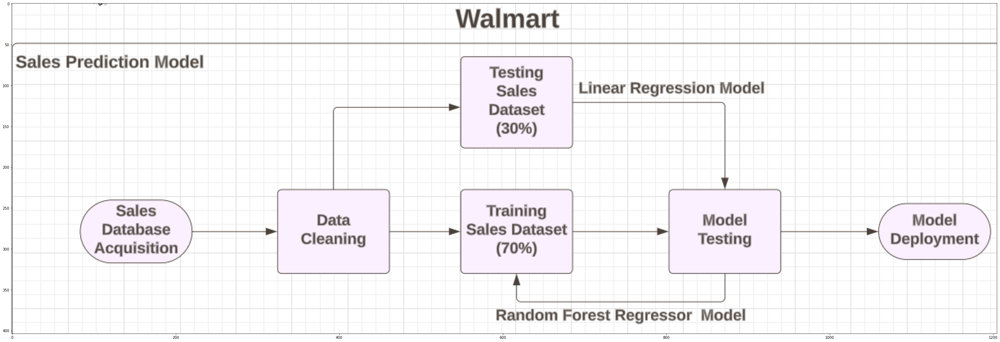

In [6]:
Model_In_Nutshell = cv2.imread('Screenshot (227).png')
plt.figure(figsize=(50,38))
plt.imshow(Model_In_Nutshell)
plt.show()

# Sales Database Acquisition:

In [49]:
Walmart = pd.read_csv('Walmart_sales.csv')
Walmart

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment rate (%)
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106
5,1,12-03-2010,1439541.59,0,57.79,2.667,211.380643,8.106
6,1,19-03-2010,1472515.79,0,54.58,2.720,211.215635,8.106
7,1,26-03-2010,1404429.92,0,51.45,2.732,211.018042,8.106
8,1,02-04-2010,1594968.28,0,62.27,2.719,210.820450,7.808
9,1,09-04-2010,1545418.53,0,65.86,2.770,210.622857,7.808


# Data-Cleaning:

In [50]:
#Extracting information about the data type of each column.
Walmart.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Store                  6435 non-null   int64  
 1   Date                   6435 non-null   object 
 2   Weekly_Sales           6435 non-null   float64
 3   Holiday_Flag           6435 non-null   int64  
 4   Temperature            6435 non-null   float64
 5   Fuel_Price             6435 non-null   float64
 6   CPI                    6435 non-null   float64
 7   Unemployment rate (%)  6435 non-null   float64
dtypes: float64(5), int64(2), object(1)
memory usage: 402.3+ KB


In [51]:
# Checking for null values.
Walmart.isnull()
##Therefore, there are no null values in the database.

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment rate (%)
0,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False
5,False,False,False,False,False,False,False,False
6,False,False,False,False,False,False,False,False
7,False,False,False,False,False,False,False,False
8,False,False,False,False,False,False,False,False
9,False,False,False,False,False,False,False,False


In [52]:
#Displaying all the rows of the database.
pd.pandas.set_option('display.max_rows',None)

In [53]:
Walmart

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment rate (%)
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106
5,1,12-03-2010,1439541.59,0,57.79,2.667,211.380643,8.106
6,1,19-03-2010,1472515.79,0,54.58,2.720,211.215635,8.106
7,1,26-03-2010,1404429.92,0,51.45,2.732,211.018042,8.106
8,1,02-04-2010,1594968.28,0,62.27,2.719,210.820450,7.808
9,1,09-04-2010,1545418.53,0,65.86,2.770,210.622857,7.808


In [54]:
# Changing the decimal places of figures under Fuel_Price, CPI and Unemployment rate upto 2 decimal places.
def Decimal_Places(column):
    return round(column,2)

In [55]:
Walmart['Fuel_Price'] = Walmart['Fuel_Price'].apply(Decimal_Places)
Walmart['CPI'] = Walmart['CPI'].apply(Decimal_Places)
Walmart['Unemployment rate (%)'] = Walmart['Unemployment rate (%)'].apply(Decimal_Places)
Walmart

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment rate (%)
0,1,05-02-2010,1643690.90,0,42.31,2.57,211.10,8.11
1,1,12-02-2010,1641957.44,1,38.51,2.55,211.24,8.11
2,1,19-02-2010,1611968.17,0,39.93,2.51,211.29,8.11
3,1,26-02-2010,1409727.59,0,46.63,2.56,211.32,8.11
4,1,05-03-2010,1554806.68,0,46.50,2.62,211.35,8.11
5,1,12-03-2010,1439541.59,0,57.79,2.67,211.38,8.11
6,1,19-03-2010,1472515.79,0,54.58,2.72,211.22,8.11
7,1,26-03-2010,1404429.92,0,51.45,2.73,211.02,8.11
8,1,02-04-2010,1594968.28,0,62.27,2.72,210.82,7.81
9,1,09-04-2010,1545418.53,0,65.86,2.77,210.62,7.81


In [56]:
# Rounding decimals upto 2 places.
Walmart[['Weekly_Sales','Holiday_Flag','Temperature','CPI','Unemployment rate (%)','Fuel_Price']] = Walmart[['Weekly_Sales','Holiday_Flag','Temperature','CPI','Unemployment rate (%)','Fuel_Price']].apply(Decimal_Places)
Walmart

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment rate (%)
0,1,05-02-2010,1643690.90,0,42.31,2.57,211.10,8.11
1,1,12-02-2010,1641957.44,1,38.51,2.55,211.24,8.11
2,1,19-02-2010,1611968.17,0,39.93,2.51,211.29,8.11
3,1,26-02-2010,1409727.59,0,46.63,2.56,211.32,8.11
4,1,05-03-2010,1554806.68,0,46.50,2.62,211.35,8.11
5,1,12-03-2010,1439541.59,0,57.79,2.67,211.38,8.11
6,1,19-03-2010,1472515.79,0,54.58,2.72,211.22,8.11
7,1,26-03-2010,1404429.92,0,51.45,2.73,211.02,8.11
8,1,02-04-2010,1594968.28,0,62.27,2.72,210.82,7.81
9,1,09-04-2010,1545418.53,0,65.86,2.77,210.62,7.81


Reggression Analysis :
We will be applying linear regression algorithm in order to predict the weekly sales of Walmart stores.
For this, purpose we will be linear relations between the weekly sales as our independent variables and other variables which will be chosen based on correlation heatmap.  

In [57]:
# Developing correlation heatmap to analyse the relationship between weekly sales and other variables.
Correlation = Walmart.corr()
Correlation
# Therefore, we will be eradicating Holiday_flag from our regression equation since it does not have any relationship with the storw's weekly sale.

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment rate (%)
Store,1.000000e+00,-0.335332,-4.386841e-16,-0.022659,0.059951,-0.209492,0.223464
Weekly_Sales,-3.353320e-01,1.000000,3.689097e-02,-0.063810,0.009481,-0.072634,-0.106228
Holiday_Flag,-4.386841e-16,0.036891,1.000000e+00,-0.155091,-0.078329,-0.002162,0.010968
Temperature,-2.265908e-02,-0.063810,-1.550913e-01,1.000000,0.144947,0.176887,0.101193
Fuel_Price,5.995057e-02,0.009481,-7.832939e-02,0.144947,1.000000,-0.170532,-0.034873
CPI,-2.094922e-01,-0.072634,-2.161542e-03,0.176887,-0.170532,1.000000,-0.302047
Unemployment rate (%),2.234644e-01,-0.106228,1.096834e-02,0.101193,-0.034873,-0.302047,1.000000


In [58]:
# Assinging dependent variable:
y = Walmart['Weekly_Sales']

In [59]:
# It should be noted that we cannot include Holiday_flag under our linear regression model since it consists of binary values (0 and 1). Therefore, Logistic regression shall be suitable for this modeling process.  
# Assinging independent variable:

X = Walmart[['Temperature','Fuel_Price','CPI','Unemployment rate (%)']]   

We will be performing train test split of the database. For this purpose, we will be assinging 30% of the database to test set and 70% for training data set.


# Model Training and Testing:

In [60]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3)

In [61]:
X_train # Training dataset.

,Temperature,Fuel_Price,CPI,Unemployment rate (%)
753,70.39,2.72,213.43,7.01
4493,44.83,3.46,192.27,8.60
5300,59.25,3.09,126.60,14.10
5507,84.93,3.52,213.93,8.18
3017,50.99,2.98,136.01,8.35
4519,65.04,3.54,194.88,8.62
241,46.66,3.11,219.00,7.44
1101,43.47,3.16,223.24,5.83
3762,30.83,3.25,136.53,8.02
1904,30.51,3.14,182.52,8.72


In [62]:
X_test      # Testing dataset

,Temperature,Fuel_Price,CPI,Unemployment rate (%)
4880,68.90,2.81,136.29,9.05
2781,62.97,3.96,208.64,7.29
4885,78.26,2.78,136.42,8.86
3515,67.51,3.74,209.02,7.27
920,27.79,3.61,192.42,8.60
6043,69.46,2.73,203.78,10.21
1544,72.74,3.89,225.01,6.66
3833,62.62,4.17,141.90,8.25
3873,67.38,3.10,126.38,14.10
3529,33.09,3.41,212.07,7.08


In [63]:
y_train   # Training y dataset

753     1385323.70
4493    1051121.02
5300     341630.46
5507    1429829.36
3017     973585.33
4519    1088943.98
241     3224369.80
1101     872113.23
3762    2139733.68
1904    2762861.41
652      303643.84
1301    1808056.41
959      593875.46
1918    1879451.23
971      621425.98
4760     955766.33
2246     508520.09
2965     770652.79
5807    1277882.77
1476    2306265.36
4428    1279080.58
3644    1054454.40
2532     890130.25
2987     668132.36
608      280681.20
367      366367.55
2127     624099.48
4057     550387.78
5099     332811.55
6051     615761.77
5009     480203.43
6236     312577.36
2459    1141860.67
6036     689326.91
1776    1864238.64
342      437084.51
1025     785515.88
6153     284617.27
1018     958225.41
5063     431412.22
6225     303108.81
993      597876.55
5304     383657.44
3260    1231752.54
649      275142.17
5064     390732.02
693      359867.80
5242     522554.04
3684    1028569.01
2582    1642970.27
1538    1438383.44
1202     515226.11
5850    1439

In [64]:
y_test # Testing dataset

4880    1160412.71
2781    1881788.19
4885    1124414.87
3515     673248.48
920      423380.14
6043     680943.03
1544    1472752.01
3833    1639999.47
3873    1186971.02
3529     997502.47
678      356427.98
5484    1243370.74
4676     267058.08
1720    1939980.43
2511     932679.79
110     1677472.78
2583    1489613.32
408      446336.80
1741    1817887.23
4830     945143.33
4163     462474.16
2924     783250.75
5442    1463942.62
1371    1650894.30
3999    1129508.61
4950     772859.25
2428     919878.34
2242     679481.90
2405     930121.14
4581     312161.00
3447     704113.22
462     1810684.68
2527    1368471.23
5624     811318.30
4914     747577.05
2482     849540.85
3583    1029849.20
4886    1121756.43
3546     658691.56
4713     252709.58
4352    1408464.08
5527    1510397.27
6128     643032.51
597      268929.03
4734     913616.32
3848    1705810.84
3001     641368.14
973      457340.06
1084     848358.09
2595    1549018.68
3835    1669388.45
943      536144.81
941      613

In [65]:
### We will be fitting our regression model to the training dataset. For which, we will have to import our linear regression model first.
from sklearn.linear_model import LinearRegression


In [66]:
Model = LinearRegression()
Model.fit(X_train,y_train)

LinearRegression()

In [67]:
######## Extracting independent variable cofficients from the equation.
print(Model.coef_)


[  -578.82855971 -24007.14756831  -1760.20241433 -45563.3299328 ]


In [68]:
######## Extracting variable intercept from the equation.
print(Model.intercept_)

1834662.1460179228


In [69]:
############Dataframing the cofficients.
pd.DataFrame(Model.coef_,X.columns,columns=['Coefficients'])

,Coefficients
Temperature,-578.828560
Fuel_Price,-24007.147568
CPI,-1760.202414
Unemployment rate (%),-45563.329933


In [70]:
####### Creating predictions of dependent variables in Test dataset.
y_Predicted_values = Model.predict(X_test)
y_Predicted_values

array([1075074.6506455 , 1003739.7003058 , 1078805.23612701, ...,
       1135819.30144287, 1079765.0592145 , 1060812.71797197])

In [71]:
y_Predicted_values = np.round(y_Predicted_values,2)
y_Predicted_values

array([1075074.65, 1003739.7 , 1078805.24, ..., 1135819.3 , 1079765.06,
       1060812.72])

In [72]:
####### Creating dataframe of y_predicted that is predicated sales of each stores.
pd.DataFrame(y_Predicted_values,columns=['Predicted Sales'])            

,Predicted Sales
0,1075074.65
1,1003739.70
2,1078805.24
3,1006635.78
4,1001367.91
5,905021.55
6,999655.43
7,1072635.90
8,856341.19
9,1037769.83


Model Evaluation: For performing model evalutation, under which we will be using 3 metrics which are:-
1) Coffiecient of determination (R^2): Under this method there is a scale between 0 and 1, we test our pramaters under test dataset in order to evaluate our        model that has been applied on training dataset. This method is Coffiecient of Demtermination. If the value is 1, then ot        means that our model is perfect otherwase it is poor.

2) Mean Absolute Error: 

3) Mean Squared Error:

In [87]:
#1) Cofficient of determination (R^2): Round cofficient of determination upto 3 decimal places.
from sklearn.metrics import r2_score  #Using cofficient of determination for evaluate the model.
COD = np.round(r2_score(y_test,y_Predicted_values),3)
print(f'The cofficient of determination is {COD}')

The cofficient of determination is 0.014


In [88]:
from sklearn import metrics

In [89]:
#2) Mean Absolute Error: Rounding up the mean absolute error upto 3 decimal places.
MAE = np.round(metrics.mean_absolute_error(y_test,y_Predicted_values),3)
print(f'Mean absolute error is {MAE}')

Mean absolute error is 467439.67


In [90]:
#3) Mean Squared Error: Rounding up the mean squared error upto 3 decimal places.
MSE = np.round(metrics.mean_squared_error(y_test,y_Predicted_values),3)
print(f'Mean squared error is {MSE}')

Mean squared error is 305720188756.577


C:\Users\kanis\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\kanis\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


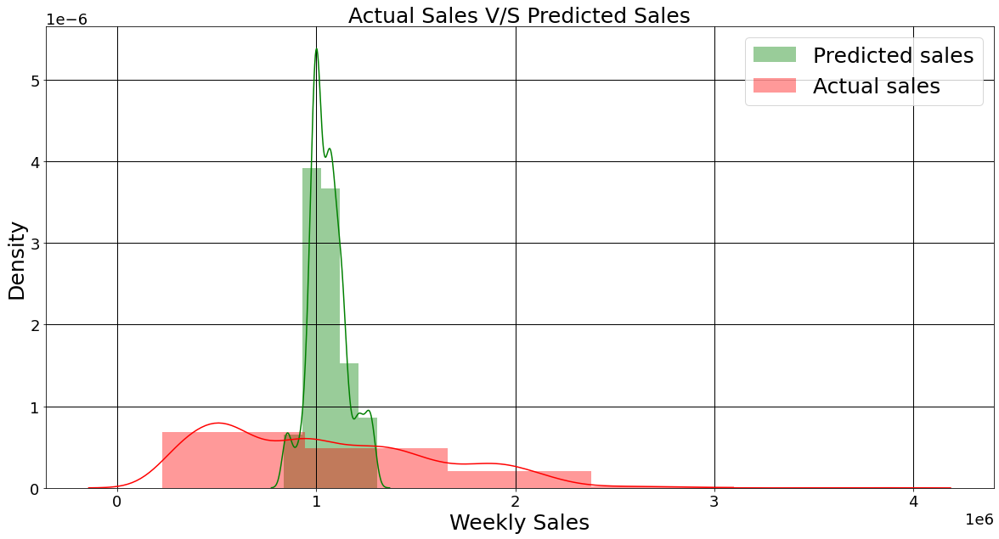

In [151]:
####Distribution plot: Weeky Sales V/S Predicted Weekly Sales
plt.figure(figsize=(20,10))
plt.rc('xtick',labelsize=18)
plt.rc('ytick',labelsize=18)
sns.distplot(y_Predicted_values,bins=5,label='Predicted sales',color='g',hist_kws=dict(linewidth=50)) # Predicted Sales
sns.distplot(y_test,bins=5,label='Actual sales',color='r',hist_kws=dict(linewidth=50))  # Actual Sales
plt.xlabel('Weekly Sales',fontsize=25)
plt.ylabel('Density',fontsize=25)
plt.grid(color='black', linestyle='-', linewidth=1)
plt.title('Actual Sales V/S Predicted Sales',fontsize=25)
plt.legend(fontsize=25)
plt.show()

Problem:
1) The cofficient of determination (R^2) is 0.014.

2) Therefore, the linear regression model suggests that independent varaiables account for 1.4% of variability in the weekly sales Walmart. 

3) Thus, the sales predictions made by the model are not fully accurate and requires further adjustments in the model. 

Solution:
In order to make our sales predictions more accurate and reduce our model errors, we will be applying a robust algorithm called Random Forest Regressoion on the dataset.  
     

# Model Adjustment:

Modified-Model:-

Algorithm: Random Forest Regressor

 

In [152]:
# Importing random forest regressor. Because model is unfit, there we will be applyignt random forest regressor.
from sklearn.ensemble import RandomForestRegressor


In [153]:
New_Model = RandomForestRegressor()
New_Model.fit(X_train,y_train)

RandomForestRegressor()

In [165]:
# Predicted weekly sales under modified model.
Y_predicted_Values = New_Model.predict(X_test)                 
Y_predicted_Values

array([1204647.9282    , 1115512.87203333, 1099931.3605    , ...,
        967816.0566    ,  835830.4327    , 1218830.6185    ])

Model Evaluation:  

In [171]:
# Cofficient of determination:
C_O_D = np.round(r2_score(y_test,Y_predicted_Values),3)
print(f'The cofficient of determination is {C_O_D}')

The cofficient of determination is 0.156


In [173]:
# Mean squared Error:
M_S_E = np.round(metrics.mean_squared_error(y_test,Y_predicted_Values),3)
print(f'Mean squared error of modified model: {M_S_E}')

Mean squared error of modified model: 261838679454.481


In [174]:
# Mean Absolute Error:
M_A_E = np.round(metrics.mean_absolute_error(y_test,Y_predicted_Values),3)
print(f'Mean absolute error of modified model: {M_A_E}' )

Mean absolute error of modified model: 369518.902


C:\Users\kanis\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\kanis\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


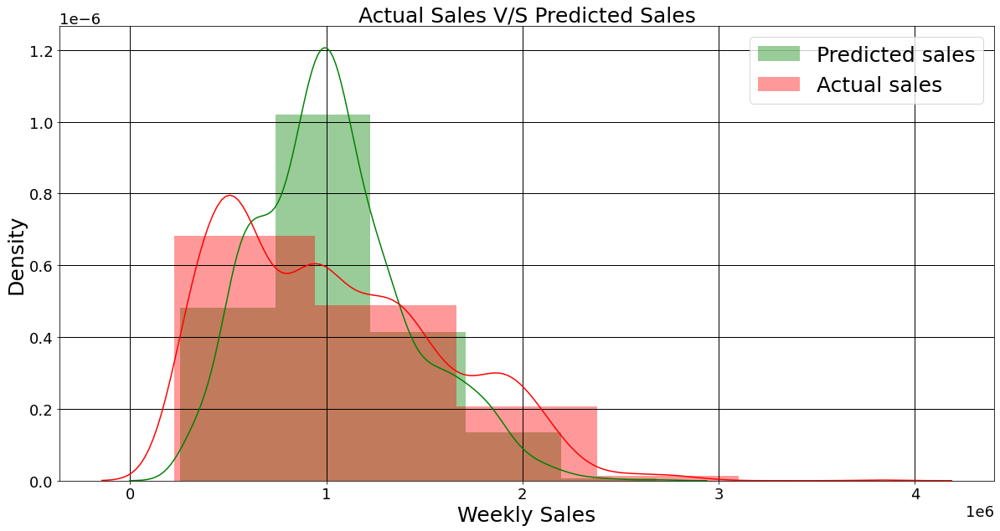

In [169]:
# Distribution plot of modified model: 
plt.figure(figsize=(20,10))
plt.rc('xtick',labelsize=18)
plt.rc('ytick',labelsize=18)
sns.distplot(Y_predicted_Values,bins=5,label='Predicted sales',color='g',hist_kws=dict(linewidth=50)) # Predicted Sales
sns.distplot(y_test,bins=5,label='Actual sales',color='r',hist_kws=dict(linewidth=50))  # Actual Sales
plt.xlabel('Weekly Sales',fontsize=25)
plt.ylabel('Density',fontsize=25)
plt.grid(color='black', linestyle='-', linewidth=1)
plt.title('Actual Sales V/S Predicted Sales',fontsize=25)
plt.legend(fontsize=25)
plt.show()

Insight:
    
1) Cofficient of determination = 0.156
   The independent variables account for 15.6% of the varuablity in weekly sales.
    
2) Mean Squared Error: 261838679454.481
    
3) Mean Absolute Error: 369518.902

# Conclusion:

The impact after the application of new algorithm to the model can be explained as follows:-

1) Cofficient of determination:

In [197]:
Model_One = 0.014
Modified_Model = 0.156 
Increase = Modified_Model-Model_One
print(f'There has been an increase in the cofficient of determination (R^2) by :{Increase}') 

There has been an increase in the cofficient of determination (R^2) by :0.142


2) Mean Squared Error:

In [193]:
Model_One =  305720188756.577
Modified_Model = 261838679454.481
Decrease = np.round(((261838679454.481-305720188756.577)/ 305720188756.577)*100,2)
print(f'There has been a precentage decrease in the dispersion between predicted and actual sales by :{Decrease} %') 

There has been a precentage decrease in the dispersion between predicted and actual sales by :-14.35 %


3) Mean Absolute Error:

In [198]:
Model_One = 467439.67
Modified_Model = 369518.902
Decrease = np.round(((Modified_Model-Model_One)/Model_One)*100,2)
print(f'There has been a precentage decrease in the absolute difference between predicted and actual sales by :{Decrease} %') 

There has been a precentage decrease in the absolute difference between predicted and actual sales by :-20.95 %


# Deployment:

Therefore, the model is ready to be deployed for sales prediction process.

